# Transfer learning

В этом ноутбуке показан процесс Transfer learning для модели CNN, обученной на датасете GTSRB. 

Мы меняем последний слой модели, чтобы стала возможна выдача предсказаний для другого датасета, RTSD. 

После этого дообучаем модель на разных выборках из этого датасета: R1 (небольшая), R3 (большая), и целиком на всем датасете R1 + R3.

## Импорт необходимых библиотек

In [39]:
import PIL
import csv
import pathlib
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import cv2
import tqdm
import numpy as np


from torch.utils.data import Dataset,DataLoader,random_split
from typing import Any,Tuple,Optional,Callable
from torch.optim import Adam,lr_scheduler
from torchvision.transforms.v2 import ToTensor,Resize,Compose,ColorJitter,RandomRotation,AugMix,RandomCrop,GaussianBlur,RandomEqualize,RandomHorizontalFlip,RandomVerticalFlip
import torch.utils.data

from torchvision import models, datasets, tv_tensors

from sklearn.metrics import accuracy_score

In [2]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
#device = 'cpu'
print(f"You will be running this notebook on {device}")

You will be running this notebook on cuda


# EDA

In [15]:
def plot_class_percent_bar(fig, series_class_counts, 
                           title: str, xlabel: str, ylabel: str, fig_name: str,
                           fontsize: int=12,
                           color='lightseagreen', edgecolor='lightseagreen'):
    plt.tight_layout()
    plt.style.use(['classic'])  # 'classic' | 'dark_background'
    fig.set_facecolor('w')
    
    bars = series_class_counts.plot.bar(color=color, edgecolor=edgecolor)

    totals = []
    for bar in bars.patches:
        totals.append(bar.get_height())
    total = sum(totals)

    ymin, ymax = bars.get_ylim()
    bars.set_ylim(top=ymax*1.1)

    # set individual bar lables using above list
    for bar in bars.patches:
        bar_height = bar.get_height()
        plt.text(bar.get_x(), bar_height + ymax*0.02,
                str(round((bar_height/total)*100, 2)) + "%",
                fontsize=fontsize, color=color, rotation=90)
        
    plt.title(title, color='k', fontsize=20)
    plt.xlabel(xlabel, color='k', fontsize=16)
    plt.ylabel(ylabel, color='k', fontsize=16)
    try:
        fig.savefig(fig_name)
        print(f"Saved to the: {fig_name}")
    except Exception as e:
        print('ERROR: Unsuccessfull saving')
        print(e)

Examples of classes names of RTSD-r1:


,class_number,sign_class
0,0,1_1
1,1,1_11


,class_number,sign_class
65,65,4_2_3
66,66,4_3



Number of classes in RTSD-r1: 67
Shape of RTSD-r1 labels DataFrame: (25432, 2)
Saved to the: ./r1_train.png
Shape of RTSD-r1 labels DataFrame: (7551, 2)
Saved to the: ./r1_test.png


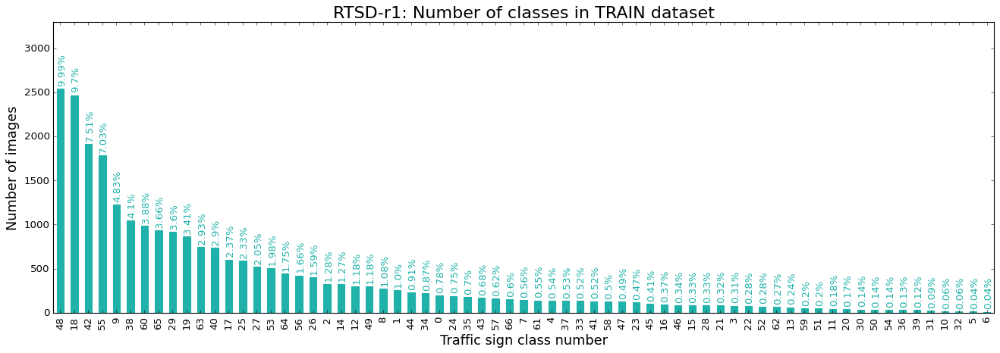

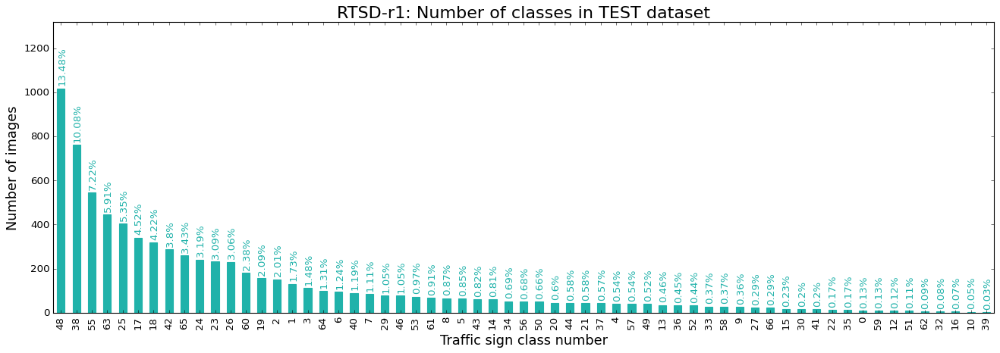

In [92]:
results_path = './'
r1_path = 'rtsd-public/classification/rtsd-r1/'

classes_names_df_r1 = pd.read_csv('rtsd-public/classification/rtsd-r1/numbers_to_classes.csv')
print("Examples of classes names of RTSD-r1:")
display(classes_names_df_r1.head(2))
display(classes_names_df_r1.tail(2))

n_classes = classes_names_df_r1['class_number'].count()
print("\nNumber of classes in RTSD-r1: " + str(n_classes))  # -> 67

labels_df_r1_train = pd.read_csv(r1_path + 'gt_train.csv')
labels_df_r1_train['filename'] = r1_path + 'train/' + labels_df_r1_train['filename']
r1_class_counts = labels_df_r1_train['class_number'].value_counts()
print(f'Shape of RTSD-r1 labels DataFrame: {labels_df_r1_train.shape}')


fig = plt.figure(figsize=(20, 6))
title = 'RTSD-r1: Number of classes in TRAIN dataset'
xlabel = 'Traffic sign class number'
ylabel = 'Number of images'
fig_name = results_path + 'r1_train.png'
plot_class_percent_bar(fig, r1_class_counts, title, xlabel, ylabel, fig_name)


labels_df_r1_test = pd.read_csv(r1_path + 'gt_test.csv')
labels_df_r1_test['filename'] = r1_path + 'test/' + labels_df_r1_test['filename']
r1_class_counts = labels_df_r1_test['class_number'].value_counts()
print(f'Shape of RTSD-r1 labels DataFrame: {labels_df_r1_test.shape}')


fig = plt.figure(figsize=(20, 6))
title = 'RTSD-r1: Number of classes in TEST dataset'
xlabel = 'Traffic sign class number'
ylabel = 'Number of images'
fig_name = results_path + 'r1_test.png'
plot_class_percent_bar(fig, r1_class_counts, title, xlabel, ylabel, fig_name)


Examples of classes names of RTSD-r3:


,class_number,sign_class
0,0,1_1
1,1,1_11


,class_number,sign_class
104,104,7_6
105,105,7_7



Number of classes in RTSD-r3: 106
Shape of RTSD-r3 labels DataFrame: (70687, 2)
Saved to the: .//r3_train.png
Shape of RTSD-r3 labels DataFrame: (22967, 2)
Saved to the: ./r3_test.png


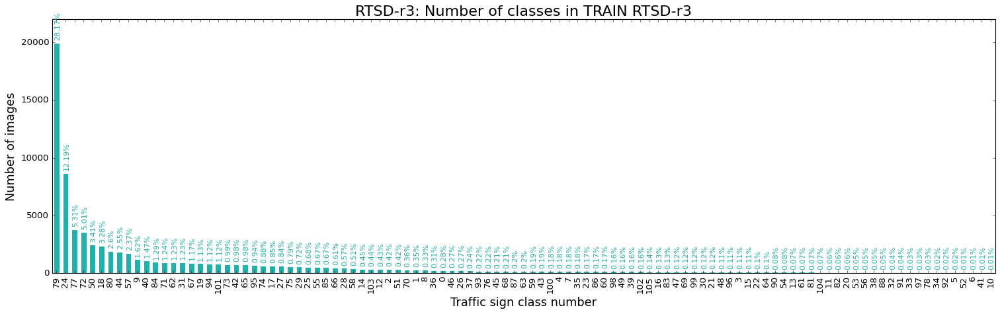

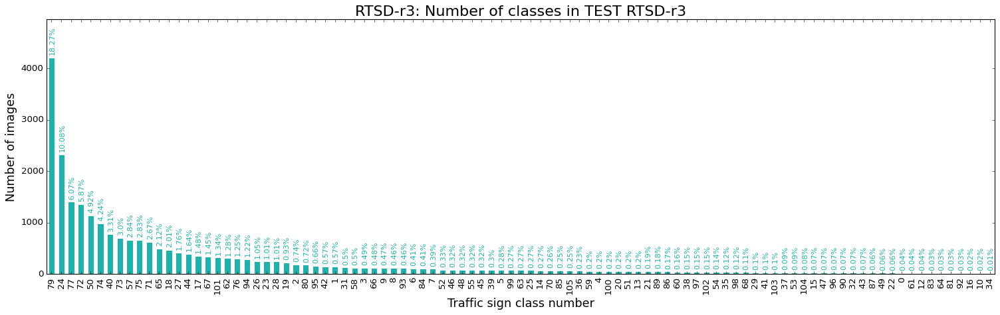

In [93]:
r3_path = 'rtsd-public/classification/rtsd-r3/'
classes_names_df_r3 = pd.read_csv(r3_path + 'numbers_to_classes.csv')
# classes_names_df_r3 = pd.ExcelFile(r3_path + 'numbers_to_classes.xlsx')
# classes_names_df_r3 = classes_names_df_r3.parse(sheet_name=0)
print("\nExamples of classes names of RTSD-r3:")
display(classes_names_df_r3.head(2))
display(classes_names_df_r3.tail(2))

n_classes_r3 = classes_names_df_r3['class_number'].count()
print("\nNumber of classes in RTSD-r3: " + str(n_classes_r3))  # -> 106

labels_df_r3_train = pd.read_csv(r3_path + 'gt_train.csv')
labels_df_r3_train['filename'] = r3_path + 'train/' + labels_df_r3_train['filename']
print(f'Shape of RTSD-r3 labels DataFrame: {labels_df_r3_train.shape}')
r3_class_counts = labels_df_r3_train['class_number'].value_counts()

fig = plt.figure(figsize=(23, 6))
title = 'RTSD-r3: Number of classes in TRAIN RTSD-r3'
xlabel = 'Traffic sign class number'
ylabel = 'Number of images'
fig_name = results_path + '/r3_train.png'
plot_class_percent_bar(fig, r3_class_counts, title, xlabel, ylabel, fig_name, fontsize=10)

labels_df_r3_test = pd.read_csv(r3_path + 'gt_test.csv')
labels_df_r3_test['filename'] = r3_path + 'test/' + labels_df_r3_test['filename']
print(f'Shape of RTSD-r3 labels DataFrame: {labels_df_r3_test.shape}')
r3_class_counts = labels_df_r3_test['class_number'].value_counts()

fig = plt.figure(figsize=(23, 6))
title = 'RTSD-r3: Number of classes in TEST RTSD-r3'
xlabel = 'Traffic sign class number'
ylabel = 'Number of images'
fig_name = results_path + 'r3_test.png'
plot_class_percent_bar(fig, r3_class_counts, title, xlabel, ylabel, fig_name, fontsize=10)

Видим огромный дизбаланс классов в обоих датасетах. В общем-то действительно некоторые знаки встречаются сильне реже, чем другие. Как раз этой проблеме и посвящена основная работа с датасетом RTSD.

Почитать можно [тут](https://nnov.hse.ru/data/2020/11/27/1350942798/rare-tsr_compressed.pdf) и [тут](https://graphics.cs.msu.ru/projects/traffic-sign-recognition.html)

In [40]:
def load_data(imgs_paths: list, width: int, height: int, 
              n_classes: int=0, num_labels: list=[]):

    data = []
    data_len = imgs_paths.shape[0]

    for i in range(data_len):
        image = cv2.imread(imgs_paths[i])
        sized_image = cv2.resize(image, (width, height))
        sized_image = cv2.cvtColor(sized_image, cv2.COLOR_BGR2RGB)

        data.append(np.array(sized_image))
        
    data = np.array(data, dtype="float") / 255.0

    # if list num_labels is not empty (len(num_labels) != 0 -> True)
    if num_labels:
        # converting labels to vector labels. 2 -> [0 0 1 0 0 ... 0]
        labels = torch.nn.functional.one_hot(num_labels, num_classes=n_classes)
        return data, labels

    else:  # if list num_labels is empty (num_labels == [] -> True)
        return data

Saved to the: ./Samples_R1_train.png


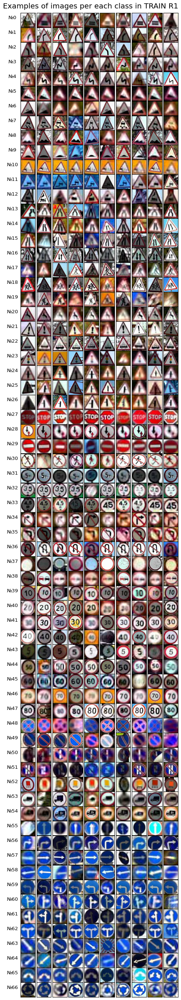

In [86]:
height = 48
width = 48
channels = 3  # RGB images
n_samples = 10  # number of columns

fig = plt.figure(figsize=((n_samples + 2)*0.5, (n_classes + 2)*0.5))
fig.subplots_adjust(left=0.1, right=1, bottom=0, top=0.97, hspace=0.005, wspace=0.005)
plt.style.use(['classic'])
fig.set_facecolor('w')

for row_i in range(n_classes):

    # filter-mask with class number row_i
    temp_filter = labels_df_r1_train["class_number"] == row_i
    
    # random samples (with n_samples images) with row_i class
    temp = labels_df_r1_train.where(temp_filter)['filename'].dropna().sample(n=n_samples, random_state=1)

    # loading images from pathes in temp to numpy.ndarray()
    temp_imgs = load_data(temp.to_numpy(), width, height, n_classes=n_classes)
    
    # print(temp_imgs[0].shape)
    for col_i in range(n_samples):
        ax = fig.add_subplot(n_classes, n_samples, 
                             row_i*10 + col_i + 1, xticks=[], yticks=[])
        
        ax.imshow(temp_imgs[col_i])
        
        # if first column, then print a ylabel with the number of class
        if col_i == 0:
            row_text = '№' + str(row_i)

            # labelpad should be selected manually (labelpad - space between beginning of ylabel and yaxis)
            ax.set_ylabel(row_text, rotation=0, labelpad=20) 

fig.suptitle('Examples of images per each class in TRAIN R1', color='k', fontsize=18)
# plt.tight_layout()

fig_name = results_path + 'Samples_R1_train.png'
try:
    fig.savefig(fig_name)
    print(f"Saved to the: {fig_name}")
except Exception as e:
    print('ERROR: Unsuccessfull saving')
    print(e)

Saved to the: ./Samples_R1_test.png


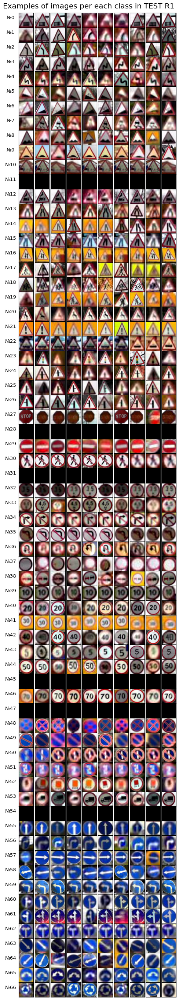

In [97]:
height = 48
width = 48
channels = 3  # RGB images
n_samples = 10  # number of columns

fig = plt.figure(figsize=((n_samples + 2)*0.5, (n_classes + 2)*0.5))
fig.subplots_adjust(left=0.1, right=1, bottom=0, top=0.97, hspace=0.005, wspace=0.005)
plt.style.use(['classic'])
fig.set_facecolor('w')

for row_i in range(n_classes):

    # filter-mask with class number row_i
    temp_filter = labels_df_r1_test["class_number"] == row_i
    
    # random samples (with n_samples images) with row_i class
    temp = labels_df_r1_test.where(temp_filter)['filename'].dropna()

    if len(temp) > 0:
        temp = temp.sample(n=n_samples, random_state=1, replace=True)
        # loading images from pathes in temp to numpy.ndarray()
        temp_imgs = load_data(temp.to_numpy(), width, height, n_classes=n_classes)
    else:
        # blank image if there is no samples of class
        temp_imgs = np.zeros((10, 50, 50, 3))
    

    for col_i in range(n_samples):
        ax = fig.add_subplot(n_classes, n_samples, 
                             row_i*10 + col_i + 1, xticks=[], yticks=[])
        
        ax.imshow(temp_imgs[col_i])
        
        # if first column, then print a ylabel with the number of class
        if col_i == 0:
            row_text = '№' + str(row_i)

            # labelpad should be selected manually (labelpad - space between beginning of ylabel and yaxis)
            ax.set_ylabel(row_text, rotation=0, labelpad=20) 

fig.suptitle('Examples of images per each class in TEST R1', color='k', fontsize=18)
# plt.tight_layout()

fig_name = results_path + 'Samples_R1_test.png'
try:
    fig.savefig(fig_name)
    print(f"Saved to the: {fig_name}")
except Exception as e:
    print('ERROR: Unsuccessfull saving')

Как видно выше, многих классов просто нет в тестовой выборке датасета R1

Saved to the: ./Samples_R3_train.png


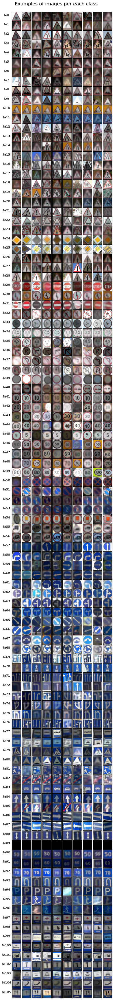

In [98]:
height = 48
width = 48
channels = 3  # RGB images
n_samples = 10  # number of columns

fig = plt.figure(figsize=((n_samples + 2)*0.5, (n_classes_r3 + 2)*0.5))
fig.subplots_adjust(left=0.1, right=1, bottom=0, top=0.97, hspace=0.005, wspace=0.005)
plt.style.use(['classic'])
fig.set_facecolor('w')

for row_i in range(n_classes_r3):

    # filter-mask with class number row_i
    temp_filter = labels_df_r3_train["class_number"] == row_i
    
    # random samples (with n_samples images) with row_i class
    temp = labels_df_r3_train.where(temp_filter)['filename'].dropna()

    if len(temp) > 0:
        temp = temp.sample(n=n_samples, random_state=1, replace=True)
        # loading images from pathes in temp to numpy.ndarray()
        temp_imgs = load_data(temp.to_numpy(), width, height, n_classes=n_classes)
    else:
        # blank image if there is no samples of class
        temp_imgs = np.zeros((10, 50, 50, 3))
    
    # print(temp_imgs[0].shape)
    for col_i in range(n_samples):
        ax = fig.add_subplot(n_classes_r3, n_samples, 
                             row_i*10 + col_i + 1, xticks=[], yticks=[])
        
        ax.imshow(temp_imgs[col_i])
        
        # if first column, then print a ylabel with the number of class
        if col_i == 0:
            row_text = '№' + str(row_i)

            # labelpad should be selected manually (labelpad - space between beginning of ylabel and yaxis)
            ax.set_ylabel(row_text, rotation=0, labelpad=20) 

fig.suptitle('Examples of images per each class', color='k', fontsize=18)
# plt.tight_layout()

fig_name = results_path + 'Samples_R3_train.png'
try:
    fig.savefig(fig_name)
    print(f"Saved to the: {fig_name}")
except Exception as e:
    print('ERROR: Unsuccessfull saving')
    print(e)

Saved to the: ./Samples_R3_test.png


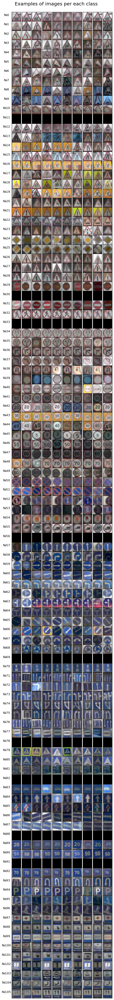

In [99]:
height = 48
width = 48
channels = 3  # RGB images
n_samples = 10  # number of columns

fig = plt.figure(figsize=((n_samples + 2)*0.5, (n_classes_r3 + 2)*0.5))
fig.subplots_adjust(left=0.1, right=1, bottom=0, top=0.97, hspace=0.005, wspace=0.005)
plt.style.use(['classic'])
fig.set_facecolor('w')

for row_i in range(n_classes_r3):

    # filter-mask with class number row_i
    temp_filter = labels_df_r3_test["class_number"] == row_i
    
    # random samples (with n_samples images) with row_i class
    temp = labels_df_r3_test.where(temp_filter)['filename'].dropna()

    if len(temp) > 0:
        temp = temp.sample(n=n_samples, random_state=1, replace=True)
        # loading images from pathes in temp to numpy.ndarray()
        temp_imgs = load_data(temp.to_numpy(), width, height, n_classes=n_classes)
    else:
        # blank image if there is no samples of class
        temp_imgs = np.zeros((10, 50, 50, 3))
    
    # print(temp_imgs[0].shape)
    for col_i in range(n_samples):
        ax = fig.add_subplot(n_classes_r3, n_samples, 
                             row_i*10 + col_i + 1, xticks=[], yticks=[])
        
        ax.imshow(temp_imgs[col_i])
        
        # if first column, then print a ylabel with the number of class
        if col_i == 0:
            row_text = '№' + str(row_i)

            # labelpad should be selected manually (labelpad - space between beginning of ylabel and yaxis)
            ax.set_ylabel(row_text, rotation=0, labelpad=20) 

fig.suptitle('Examples of images per each class', color='k', fontsize=18)
# plt.tight_layout()

fig_name = results_path + 'Samples_R3_test.png'
try:
    fig.savefig(fig_name)
    print(f"Saved to the: {fig_name}")
except Exception as e:
    print('ERROR: Unsuccessfull saving')
    print(e)

Как видим, класс 89 не представлен в тренировочном датасете R3. Зато в тестовом датасете он есть! 

С другой стороны, в тестовой выборке отсутствует много других классов. 

В такой ситуации получить объективные метрики будет достаточно проблематично..

## Определяем класс модели

In [3]:
class GTSRB_MODEL(nn.Module):
    def __init__(self, input_dim, output_dim):
        """
        Initializing the model
        """

        super(GTSRB_MODEL,self).__init__()
        self.input_dim = input_dim
        self.output_dim = output_dim

        self.metrics = {}

        self.flatten = nn.Flatten()

        self.dropout2 = nn.Dropout(0.2)
        self.dropout3 = nn.Dropout(0.3)

        self.relu = nn.ReLU()
        self.maxpool = nn.MaxPool2d(2)

        # building layers
        self.conv1 = nn.Conv2d(in_channels=3,out_channels=32,kernel_size=3,padding=1)
        self.conv2 = nn.Conv2d(in_channels=32,out_channels=64,kernel_size=3,padding=1)
        self.batchnorm1 = nn.BatchNorm2d(64)

        self.conv3 = nn.Conv2d(in_channels=64,out_channels=128,kernel_size=3,padding=1)
        self.conv4 = nn.Conv2d(in_channels=128,out_channels=256,kernel_size=3,padding=1)
        self.batchnorm2 = nn.BatchNorm2d(256)

        self.conv5 = nn.Conv2d(in_channels=256,out_channels=512,kernel_size=3)
        self.conv6 = nn.Conv2d(in_channels=512,out_channels=1024,kernel_size=3)
        self.batchnorm3 = nn.BatchNorm2d(1024)


        self.l1 = nn.Linear(1024*4*4,512)
        self.l2 = nn.Linear(512,128)
        self.batchnorm4 = nn.LayerNorm(128)
        self.l3 = nn.Linear(128,output_dim)


    def forward(self, input):
        """
        Forward propagation...
        """

        conv = self.conv1(input)
        conv = self.conv2(conv)
        batchnorm = self.relu(self.batchnorm1(conv))
        maxpool = self.maxpool(batchnorm)

        conv = self.conv3(maxpool)
        conv = self.conv4(conv)
        batchnorm = self.relu(self.batchnorm2(conv))
        maxpool = self.maxpool(batchnorm)

        conv = self.conv5(maxpool)
        conv = self.conv6(conv)
        batchnorm = self.relu(self.batchnorm3(conv))
        maxpool = self.maxpool(batchnorm)

        flatten = self.flatten(maxpool)

        dense_l1 = self.l1(flatten)
        dropout = self.dropout3(dense_l1)
        dense_l2 = self.l2(dropout)
        batchnorm = self.batchnorm4(dense_l2)
        dropout = self.dropout2(batchnorm)
        output = self.l3(dropout)


        return output


    def training_metrics(self, positives, data_size, loss):
        """
        Calculates accuracy score for training dataset.

        Args:
        positives (int): Counter of correct predictions
        data_size (int): length of training dataset
        loss (float): value of Loss fucntion

        Returns:
        loss (float): value of Loss fucntion
        accuracy (float): Accuracy score

        """

        accuracy = positives/data_size

        return loss, accuracy


    def validation_metrics(self, validation_data, loss_function):
        """
        Calculates accuracy score for validation dataset.

        Args:
        validation_data (list): Validation dataset
        loss_function

        Returns:
        val_loss (float): value of Loss fucntion
        val_accuracy (float): Accuracy score

        """

        data_size = len(validation_data)
        correct_predictions = 0
        total_samples = 0
        val_loss = 0

        model = self.eval()
        with torch.no_grad():
            for step,(input,label) in enumerate(validation_data):
                input,label = input.to(device),label.to(device)
                prediction = model.forward(input)
                loss = loss_function(prediction,label)
                val_loss = loss.item()
                _,predicted = torch.max(prediction,1)
                correct_predictions += (predicted == label).sum().item()
                total_samples += label.size(0)

        val_accuracy = correct_predictions/total_samples

        return val_loss, val_accuracy


    def history(self):

        return self.metrics


    def compile(self, train_data, validation_data, epochs, loss_function,
                optimizer, learning_rate_scheduler):
        """
        Model training process.

        Args:
        train_data (list): train dataset
        validation_data (list): validation dataset
        epochs (int): number of epochs
        loss_function (function)
        optimizer (function)
        learning_rate_scheduler (function)
        """
        val_acc_list = []
        val_loss_list = []

        train_acc_list = []
        train_loss_list = []

        learning_rate_list = []

        print('Beginning training...')
        STEPS = len(train_data)
        for epoch in range(epochs):
            lr = optimizer.param_groups[0]["lr"]
            learning_rate_list.append(lr)
            correct_predictions = 0
            total_examples = 0
            loss = 0
            with tqdm.trange(STEPS) as progress:

                for step,(input,label) in enumerate(train_loader):

                    input,label = input.to(device),label.to(device)
                    prediction = self.forward(input)

                    _, predicted = torch.max(prediction, 1)
                    correct_predictions += (predicted == label).sum().item()
                    total_examples += label.size(0)
                    l = loss_function(prediction,label)
                    loss = l.item()
                    l.backward()
                    optimizer.step()
                    optimizer.zero_grad()

                    progress.colour = 'blue'
                    progress.desc = (f'Epoch [{epoch}/{EPOCHS}], Step [{step}/{STEPS}],'
                                     f'Learning Rate [{lr}], Loss [{"{:.4f}".format(l)}],'
                                     f'Accuracy [{"{:.4f}".format(correct_predictions/total_examples)}]')
                    progress.update(1)

            training_loss,training_acc = self.training_metrics(correct_predictions,total_examples,loss)
            train_acc_list.append(training_acc)
            train_loss_list.append(training_loss)

            val_loss, val_acc = self.validation_metrics(validation_data,loss_function)
            val_acc_list.append(val_acc)
            val_loss_list.append(val_loss)

            print(f'val_accuracy [{val_acc}], val_loss [{val_loss}]')

            learning_rate_scheduler.step()

        metrics_dict = {
                'train_acc':train_acc_list,
                'train_loss':train_loss_list,
                'val_acc':val_acc_list,
                'val_loss':val_loss_list,
                'learning_rate':optimizer.param_groups[0]["lr"]
            }
        self.metrics = metrics_dict
        print('Training complete!')

## Создаем класс для нашего нового датасета RTSD

In [4]:
class RTSD(Dataset):


    def __init__(self,
                 root: str,
                 split: str,
                 transform: Optional[Callable] = None):

        self.base_folder = pathlib.Path(root) 
        self.csv_file = self.base_folder / ('gt_train.csv' if split =='train' else 'gt_test.csv')
        self.base_folder = self.base_folder / ('train' if split =='train' else 'test')

        # Change this according to your system
        with open(str(self.csv_file)) as csvfile:
           samples = [(str(self.base_folder / row['filename']),int(row['class_number']))
            for row in csv.DictReader(csvfile,delimiter=',',skipinitialspace=True)
                ]


        self.samples = samples
        self.split = split
        self.transform = transform


    def __len__(self):

        return len(self.samples)


    def __getitem__(self, index: int) -> Tuple:

        path,classId =  self.samples[index]
        sample = PIL.Image.open(path).convert('RGB')
        if self.transform is not None:
            sample = self.transform(sample)

        return sample,classId

In [5]:
train_transforms = Compose(
    [
        ColorJitter(brightness=1.0, contrast=0.5, saturation=1, hue=0.1),
        RandomEqualize(0.4),
        AugMix(),
        RandomHorizontalFlip(0.3),
        RandomVerticalFlip(0.3),
        GaussianBlur((3,3)),
        RandomRotation(30),
        Resize([50,50]),
        ToTensor()
    ]
)
validation_transforms =  Compose(
    [
        Resize([50,50]),
        ToTensor()
    ]
)

/home/vagabond/Documents/signs-classification/venv/lib/python3.10/site-packages/torchvision/transforms/v2/_deprecated.py:43: UserWarning: The transform `ToTensor()` is deprecated and will be removed in a future release. Instead, please use `v2.Compose([v2.ToImage(), v2.ToDtype(torch.float32, scale=True)])`.
  warnings.warn(


In [6]:
def train_test_split(dataset,train_size):

    train_size = int(train_size * len(dataset))
    test_size = int(len(dataset) - train_size)

    return random_split(dataset,[train_size,test_size])

# Обучение на R1

In [7]:
dataset = RTSD(root='rtsd-public/classification/rtsd-r1/',split="train")
train_set,validation_set = train_test_split(dataset,train_size=0.8)
print(f'training size : {len(train_set)}, Validation size : {len(validation_set)}')

training size : 20345, Validation size : 5087


Проверим, что картинки грузятся корректно

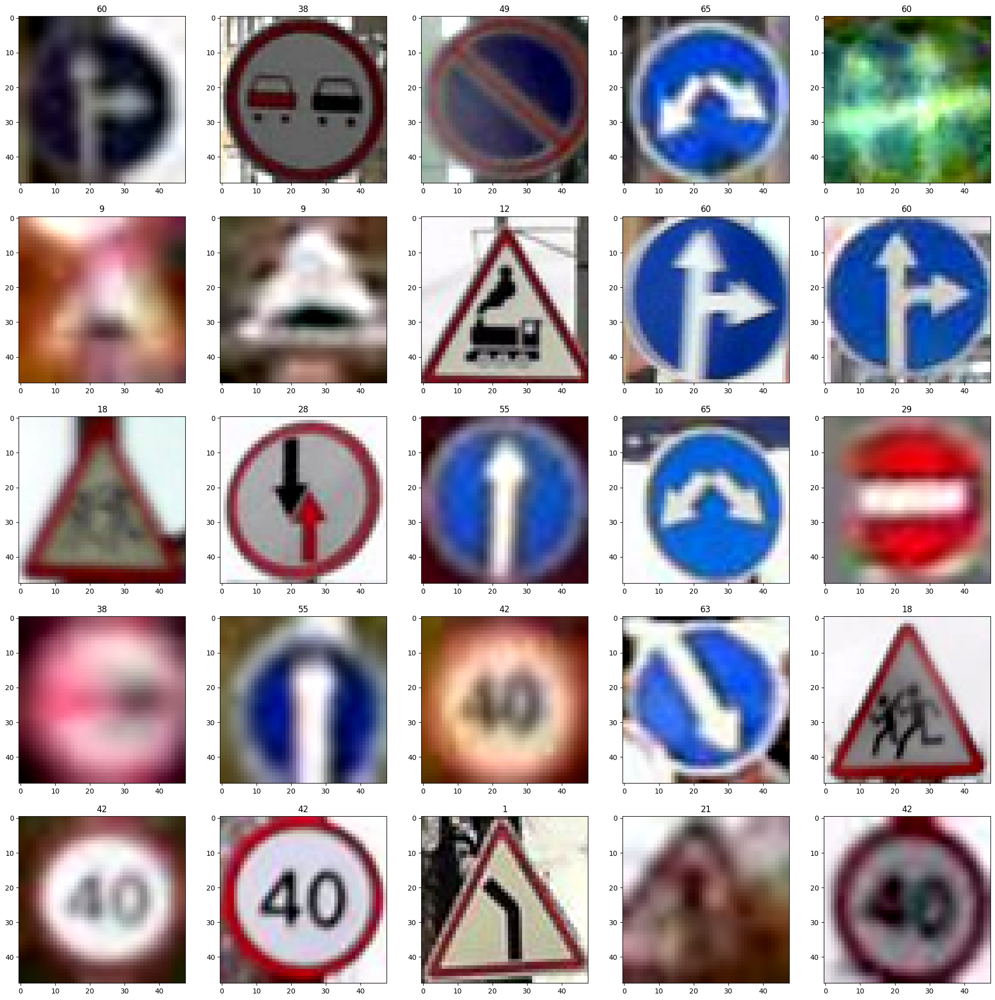

In [8]:
plt.figure(figsize=(25,25))
for i in range(1,26):
    input,label = train_set[i]
    plt.subplot(5,5,i)
    plt.title(label)
    plt.imshow(input)

In [9]:
train_set.dataset.transform = train_transforms
validation_set.dataset.transform = validation_transforms

In [10]:
BATCH_SIZE = 64
train_loader = DataLoader(dataset=train_set,batch_size=BATCH_SIZE,shuffle=True)
validation_loader = DataLoader(dataset=validation_set,batch_size=BATCH_SIZE)

In [11]:
EPOCHS = 20
LEARNING_RATE = 0.0008
INPUT_DIM = 3*50*50
OUTPUT_DIM = 43
model = GTSRB_MODEL(INPUT_DIM,OUTPUT_DIM)

optimizer = Adam(params=model.parameters(),lr=LEARNING_RATE)
lr_s = lr_scheduler.LinearLR(optimizer,start_factor=1.0,end_factor=0.5,total_iters=10)
loss = nn.CrossEntropyLoss()

In [12]:
model.load_state_dict(torch.load('../../services/sign_classifier/models/cnn_torch.pt'))

<All keys matched successfully>

In [13]:
NEW_OUTPUT_DIM = 67

model.l3 = nn.Linear(128, NEW_OUTPUT_DIM)

model.to(device)

GTSRB_MODEL(
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (dropout2): Dropout(p=0.2, inplace=False)
  (dropout3): Dropout(p=0.3, inplace=False)
  (relu): ReLU()
  (maxpool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (batchnorm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (batchnorm2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv5): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1))
  (conv6): Conv2d(512, 1024, kernel_size=(3, 3), stride=(1, 1))
  (batchnorm3): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (l1): Linear(in_fe

In [14]:
model.compile(train_data=train_loader,validation_data=validation_loader,epochs=EPOCHS,loss_function=loss,optimizer=optimizer,learning_rate_scheduler=lr_s)

Beginning training...


Epoch [0/20], Step [317/318],Learning Rate [0.0008], Loss [0.3672],Accuracy [0.8554]: 100%|██████████| 318/318 [00:15<00:00, 20.62it/s]


val_accuracy [0.9581285630037351], val_loss [0.3003677725791931]


Epoch [1/20], Step [317/318],Learning Rate [0.00076], Loss [0.2022],Accuracy [0.9749]: 100%|██████████| 318/318 [00:09<00:00, 33.14it/s]


val_accuracy [0.9775899351287596], val_loss [0.15564221143722534]


Epoch [2/20], Step [317/318],Learning Rate [0.00072], Loss [0.0547],Accuracy [0.9926]: 100%|██████████| 318/318 [00:09<00:00, 33.21it/s]


val_accuracy [0.9844702182032632], val_loss [0.11098840832710266]


Epoch [3/20], Step [317/318],Learning Rate [0.00068], Loss [0.0220],Accuracy [0.9968]: 100%|██████████| 318/318 [00:09<00:00, 33.99it/s]


val_accuracy [0.9862394338509928], val_loss [0.22360152006149292]


Epoch [4/20], Step [317/318],Learning Rate [0.00064], Loss [0.0581],Accuracy [0.9979]: 100%|██████████| 318/318 [00:09<00:00, 33.91it/s]


val_accuracy [0.9878120699823079], val_loss [0.1310727894306183]


Epoch [5/20], Step [317/318],Learning Rate [0.0006000000000000001], Loss [0.0333],Accuracy [0.9988]: 100%|██████████| 318/318 [00:09<00:00, 33.97it/s]


val_accuracy [0.9868291724002359], val_loss [0.09345792979001999]


Epoch [6/20], Step [317/318],Learning Rate [0.0005600000000000001], Loss [0.0085],Accuracy [0.9977]: 100%|██████████| 318/318 [00:09<00:00, 34.06it/s]


val_accuracy [0.9858462748181639], val_loss [0.062223225831985474]


Epoch [7/20], Step [317/318],Learning Rate [0.0005200000000000001], Loss [0.0030],Accuracy [0.9987]: 100%|██████████| 318/318 [00:09<00:00, 34.03it/s]


val_accuracy [0.9887949675643798], val_loss [0.019184455275535583]


Epoch [8/20], Step [317/318],Learning Rate [0.00048000000000000007], Loss [0.0024],Accuracy [0.9995]: 100%|██████████| 318/318 [00:09<00:00, 33.77it/s]


val_accuracy [0.9882052290151366], val_loss [0.06945197284221649]


Epoch [9/20], Step [317/318],Learning Rate [0.00044000000000000007], Loss [0.0016],Accuracy [1.0000]: 100%|██████████| 318/318 [00:09<00:00, 33.89it/s]


val_accuracy [0.989384706113623], val_loss [0.042651280760765076]


Epoch [10/20], Step [317/318],Learning Rate [0.0004000000000000001], Loss [0.0016],Accuracy [1.0000]: 100%|██████████| 318/318 [00:09<00:00, 33.71it/s]


val_accuracy [0.9899744446628661], val_loss [0.046149205416440964]


Epoch [11/20], Step [317/318],Learning Rate [0.0004000000000000001], Loss [0.0012],Accuracy [1.0000]: 100%|██████████| 318/318 [00:09<00:00, 33.52it/s]


val_accuracy [0.9895812856300373], val_loss [0.04780914634466171]


Epoch [12/20], Step [317/318],Learning Rate [0.0004000000000000001], Loss [0.0011],Accuracy [1.0000]: 100%|██████████| 318/318 [00:09<00:00, 34.15it/s]


val_accuracy [0.989384706113623], val_loss [0.04686696082353592]


Epoch [13/20], Step [317/318],Learning Rate [0.0004000000000000001], Loss [0.0008],Accuracy [1.0000]: 100%|██████████| 318/318 [00:09<00:00, 34.28it/s]


val_accuracy [0.9887949675643798], val_loss [0.048169538378715515]


Epoch [14/20], Step [317/318],Learning Rate [0.0004000000000000001], Loss [0.0011],Accuracy [1.0000]: 100%|██████████| 318/318 [00:09<00:00, 34.09it/s]


val_accuracy [0.9891881265972086], val_loss [0.047007814049720764]


Epoch [15/20], Step [317/318],Learning Rate [0.0004000000000000001], Loss [0.0008],Accuracy [1.0000]: 100%|██████████| 318/318 [00:09<00:00, 33.53it/s]


val_accuracy [0.9889915470807942], val_loss [0.039355192333459854]


Epoch [16/20], Step [317/318],Learning Rate [0.0004000000000000001], Loss [0.0007],Accuracy [1.0000]: 100%|██████████| 318/318 [00:09<00:00, 33.81it/s]


val_accuracy [0.9887949675643798], val_loss [0.048892490565776825]


Epoch [17/20], Step [317/318],Learning Rate [0.0004000000000000001], Loss [0.0006],Accuracy [1.0000]: 100%|██████████| 318/318 [00:09<00:00, 33.86it/s]


val_accuracy [0.9887949675643798], val_loss [0.04297860339283943]


Epoch [18/20], Step [317/318],Learning Rate [0.0004000000000000001], Loss [0.0005],Accuracy [1.0000]: 100%|██████████| 318/318 [00:09<00:00, 31.89it/s]


val_accuracy [0.9885983880479654], val_loss [0.039409536868333817]


Epoch [19/20], Step [317/318],Learning Rate [0.0004000000000000001], Loss [0.0004],Accuracy [1.0000]: 100%|██████████| 318/318 [00:09<00:00, 33.05it/s]


val_accuracy [0.9891881265972086], val_loss [0.047502852976322174]
Training complete!


In [ ]:
transforms = Compose(
    [
        Resize([50,50]),
        ToTensor(),
    ]
)

testdata = RTSD(root='rtsd-public/classification/rtsd-r1/',split='test',transform=transforms)
test_dataloader = DataLoader(testdata)
print('testing size :',len(testdata))

testing size : 7551


In [ ]:
y_pred = []
y_true = []
model = model.eval().to(device)
with tqdm.tqdm(colour='green',total=len(test_dataloader)) as progress:

  with torch.no_grad() :
    for id,(input,label) in enumerate(iter(test_dataloader)):
        input,label = input.to(device),label.to(device)
        y_true.append(label.item())
        prediction = model.forward(input)
        _,prediction = torch.max(prediction,1)
        y_pred.append(prediction.item())

        progress.desc = f'Test Accuracy : {accuracy_score(y_true,y_pred)} '
        progress.update(1)

Test Accuracy : 0.9584161038273077 : 100%|██████████| 7551/7551 [00:14<00:00, 529.85it/s]


<Axes: >

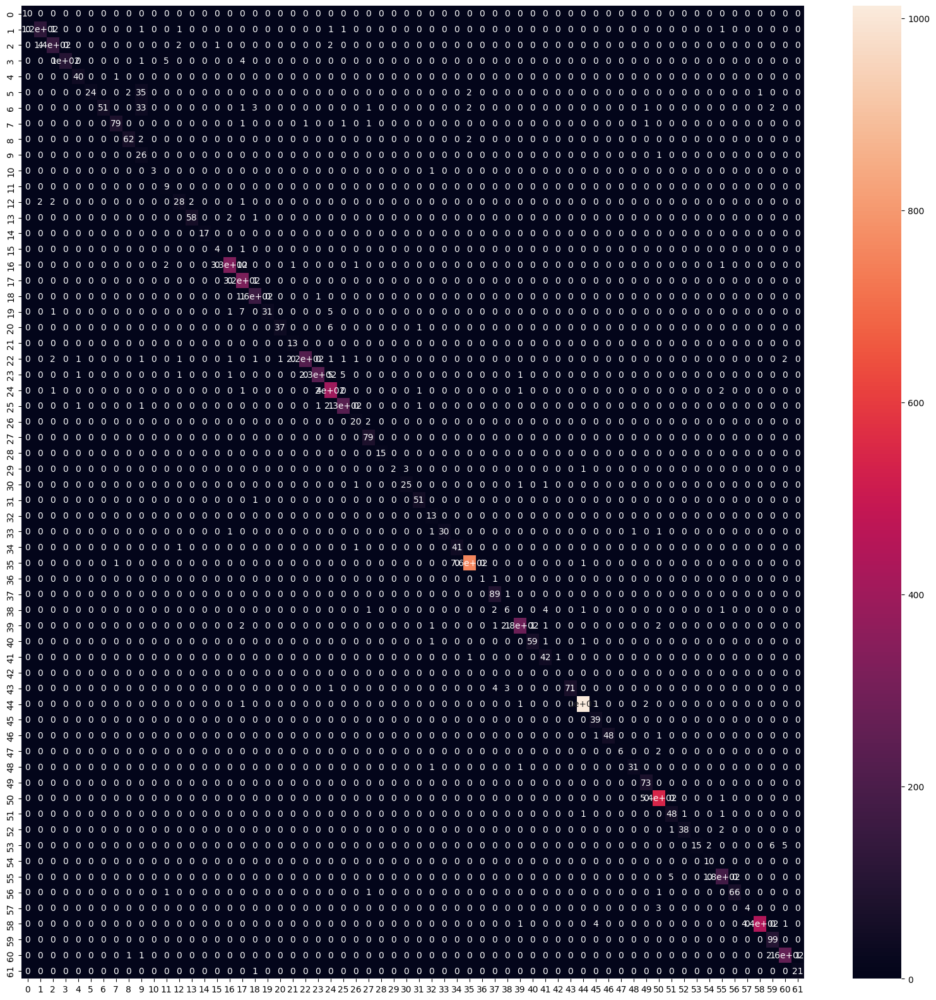

In [ ]:
from sklearn.metrics import confusion_matrix

cf = confusion_matrix(y_true, y_pred)
df_cm = pd.DataFrame(cf)
plt.figure(figsize = (20,20))
sns.heatmap(df_cm, annot=True)

In [ ]:
from sklearn.metrics import classification_report

print(classification_report(y_true, y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        10
           1       0.95      0.95      0.95       131
           2       0.95      0.94      0.95       152
           3       1.00      0.91      0.95       112
           4       0.93      0.98      0.95        41
           5       1.00      0.38      0.55        64
           6       1.00      0.54      0.70        94
           7       0.98      0.94      0.96        84
           8       0.95      0.94      0.95        66
           9       0.26      0.96      0.41        27
          10       1.00      0.75      0.86         4
          12       0.53      1.00      0.69         9
          13       0.82      0.80      0.81        35
          14       0.97      0.95      0.96        61
          15       1.00      1.00      1.00        17
          16       0.80      0.80      0.80         5
          17       0.98      0.96      0.97       341
          18       0.91    

/home/vagabond/Documents/signs-classification/venv/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/vagabond/Documents/signs-classification/venv/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/vagabond/Documents/signs-classification/venv/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, mo

In [ ]:
torch.save(model.state_dict(), 'cnn_rtsd_r1.pt')

# R3

In [59]:
dataset = RTSD(root='rtsd-public/classification/rtsd-r3/',split="train")
train_set,validation_set = train_test_split(dataset,train_size=0.8)
print(f'training size : {len(train_set)}, Validation size : {len(validation_set)}')

training size : 56549, Validation size : 14138


In [60]:
import tqdm
EPOCHS = 20
LEARNING_RATE = 0.0008
INPUT_DIM = 3*48*48
OUTPUT_DIM = 43
model = GTSRB_MODEL(INPUT_DIM,OUTPUT_DIM)

optimizer = Adam(params=model.parameters(),lr=LEARNING_RATE)
lr_s = lr_scheduler.LinearLR(optimizer,start_factor=1.0,end_factor=0.5,total_iters=10)
loss = nn.CrossEntropyLoss()

In [61]:
model.load_state_dict(torch.load('../../services/sign_classifier/models/cnn_torch.pt'))

<All keys matched successfully>

In [62]:
NEW_OUTPUT_DIM =106

model.l3 = nn.Linear(128, NEW_OUTPUT_DIM)

model.to(device)

GTSRB_MODEL(
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (dropout2): Dropout(p=0.2, inplace=False)
  (dropout3): Dropout(p=0.3, inplace=False)
  (relu): ReLU()
  (maxpool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (batchnorm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (batchnorm2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv5): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1))
  (conv6): Conv2d(512, 1024, kernel_size=(3, 3), stride=(1, 1))
  (batchnorm3): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (l1): Linear(in_fe

In [63]:
train_set.dataset.transform = train_transforms
validation_set.dataset.transform = validation_transforms

In [64]:
BATCH_SIZE = 64
train_loader = DataLoader(dataset=train_set,batch_size=BATCH_SIZE,shuffle=True)
validation_loader = DataLoader(dataset=validation_set,batch_size=BATCH_SIZE)

In [65]:
model.compile(train_data=train_loader,validation_data=validation_loader,epochs=EPOCHS,loss_function=loss,optimizer=optimizer,learning_rate_scheduler=lr_s)

Beginning training...


  0%|          | 0/884 [00:00<?, ?it/s]

Epoch [0/20], Step [883/884],Learning Rate [0.0008], Loss [0.0574],Accuracy [0.8964]: 100%|██████████| 884/884 [00:29<00:00, 30.45it/s]


val_accuracy [0.9656952892912718], val_loss [0.13195942342281342]


Epoch [1/20], Step [883/884],Learning Rate [0.00076], Loss [0.0279],Accuracy [0.9785]: 100%|██████████| 884/884 [00:27<00:00, 32.09it/s]


val_accuracy [0.9804074126467676], val_loss [0.04847554489970207]


Epoch [2/20], Step [883/884],Learning Rate [0.00072], Loss [0.0296],Accuracy [0.9926]: 100%|██████████| 884/884 [00:27<00:00, 32.07it/s]


val_accuracy [0.9845098316593578], val_loss [0.053802598267793655]


Epoch [3/20], Step [883/884],Learning Rate [0.00068], Loss [0.0192],Accuracy [0.9957]: 100%|██████████| 884/884 [00:27<00:00, 32.08it/s]


val_accuracy [0.9828122789644929], val_loss [0.06470250338315964]


Epoch [4/20], Step [883/884],Learning Rate [0.00064], Loss [0.0070],Accuracy [0.9979]: 100%|██████████| 884/884 [00:27<00:00, 32.07it/s]


val_accuracy [0.9840147121233555], val_loss [0.11134006828069687]


Epoch [5/20], Step [883/884],Learning Rate [0.0006000000000000001], Loss [0.0096],Accuracy [0.9962]: 100%|██████████| 884/884 [00:27<00:00, 32.25it/s]


val_accuracy [0.9882585938605177], val_loss [0.04777790606021881]


Epoch [6/20], Step [883/884],Learning Rate [0.0005600000000000001], Loss [0.0136],Accuracy [0.9982]: 100%|██████████| 884/884 [00:27<00:00, 32.15it/s]


val_accuracy [0.9897439524685245], val_loss [0.048834968358278275]


Epoch [7/20], Step [883/884],Learning Rate [0.0005200000000000001], Loss [0.0034],Accuracy [0.9982]: 100%|██████████| 884/884 [00:27<00:00, 32.16it/s]


val_accuracy [0.9878342056868016], val_loss [0.14008618891239166]


Epoch [8/20], Step [883/884],Learning Rate [0.00048000000000000007], Loss [0.0020],Accuracy [0.9990]: 100%|██████████| 884/884 [00:27<00:00, 31.94it/s]


val_accuracy [0.9826000848776347], val_loss [0.047340232878923416]


Epoch [9/20], Step [883/884],Learning Rate [0.00044000000000000007], Loss [0.0005],Accuracy [0.9992]: 100%|██████████| 884/884 [00:27<00:00, 32.23it/s]


val_accuracy [0.9890366388456642], val_loss [0.05197460204362869]


Epoch [10/20], Step [883/884],Learning Rate [0.0004000000000000001], Loss [0.0004],Accuracy [0.9993]: 100%|██████████| 884/884 [00:27<00:00, 32.24it/s]


val_accuracy [0.9903805347290989], val_loss [0.04885198175907135]


Epoch [11/20], Step [883/884],Learning Rate [0.0004000000000000001], Loss [0.0004],Accuracy [0.9995]: 100%|██████████| 884/884 [00:27<00:00, 31.86it/s]


val_accuracy [0.9915122365256754], val_loss [0.05236373096704483]


Epoch [12/20], Step [883/884],Learning Rate [0.0004000000000000001], Loss [0.0013],Accuracy [0.9985]: 100%|██████████| 884/884 [00:28<00:00, 31.54it/s]


val_accuracy [0.9872683547885133], val_loss [0.025074118748307228]


Epoch [13/20], Step [883/884],Learning Rate [0.0004000000000000001], Loss [0.0034],Accuracy [0.9996]: 100%|██████████| 884/884 [00:27<00:00, 32.58it/s]


val_accuracy [0.9891073702079503], val_loss [0.043003275990486145]


Epoch [14/20], Step [883/884],Learning Rate [0.0004000000000000001], Loss [0.0188],Accuracy [0.9989]: 100%|██████████| 884/884 [00:27<00:00, 32.35it/s]


val_accuracy [0.9855708020936483], val_loss [0.09147084504365921]


Epoch [15/20], Step [883/884],Learning Rate [0.0004000000000000001], Loss [0.0002],Accuracy [0.9993]: 100%|██████████| 884/884 [00:27<00:00, 32.26it/s]


val_accuracy [0.9904512660913849], val_loss [0.058303914964199066]


Epoch [16/20], Step [883/884],Learning Rate [0.0004000000000000001], Loss [0.1098],Accuracy [0.9997]: 100%|██████████| 884/884 [00:27<00:00, 31.83it/s]


val_accuracy [0.9884707879473759], val_loss [0.10370583087205887]


Epoch [17/20], Step [883/884],Learning Rate [0.0004000000000000001], Loss [0.0002],Accuracy [0.9990]: 100%|██████████| 884/884 [00:27<00:00, 32.17it/s]


val_accuracy [0.9903098033668128], val_loss [0.03662930801510811]


Epoch [18/20], Step [883/884],Learning Rate [0.0004000000000000001], Loss [0.0004],Accuracy [0.9988]: 100%|██████████| 884/884 [00:27<00:00, 32.15it/s]


val_accuracy [0.9875512802376574], val_loss [0.10424479097127914]


Epoch [19/20], Step [883/884],Learning Rate [0.0004000000000000001], Loss [0.0003],Accuracy [0.9995]: 100%|██████████| 884/884 [00:27<00:00, 32.11it/s]


val_accuracy [0.9913000424388174], val_loss [0.013766956515610218]
Training complete!


In [66]:
transforms = Compose(
    [
        Resize([50,50]),
        ToTensor(),
    ]
)

testdata = RTSD(root='rtsd-public/classification/rtsd-r3/',split='test',transform=transforms)
test_dataloader = DataLoader(testdata)
print('testing size :',len(testdata))

testing size : 22967


/home/vagabond/Documents/signs-classification/venv/lib/python3.10/site-packages/torchvision/transforms/v2/_deprecated.py:43: UserWarning: The transform `ToTensor()` is deprecated and will be removed in a future release. Instead, please use `v2.Compose([v2.ToImage(), v2.ToDtype(torch.float32, scale=True)])`.
  warnings.warn(


In [67]:
y_pred = []
y_true = []
model = model.eval().to(device)
with tqdm.tqdm(colour='green',total=len(test_dataloader)) as progress:

  with torch.no_grad() :
    for id,(input,label) in enumerate(iter(test_dataloader)):
        input,label = input.to(device),label.to(device)
        y_true.append(label.item())
        prediction = model.forward(input)
        _,prediction = torch.max(prediction,1)
        y_pred.append(prediction.item())

        progress.desc = f'Test Accuracy : {accuracy_score(y_true,y_pred)} '
        progress.update(1)

Test Accuracy : 0.9605956372186181 : 100%|██████████| 22967/22967 [01:02<00:00, 369.01it/s]


<Axes: >

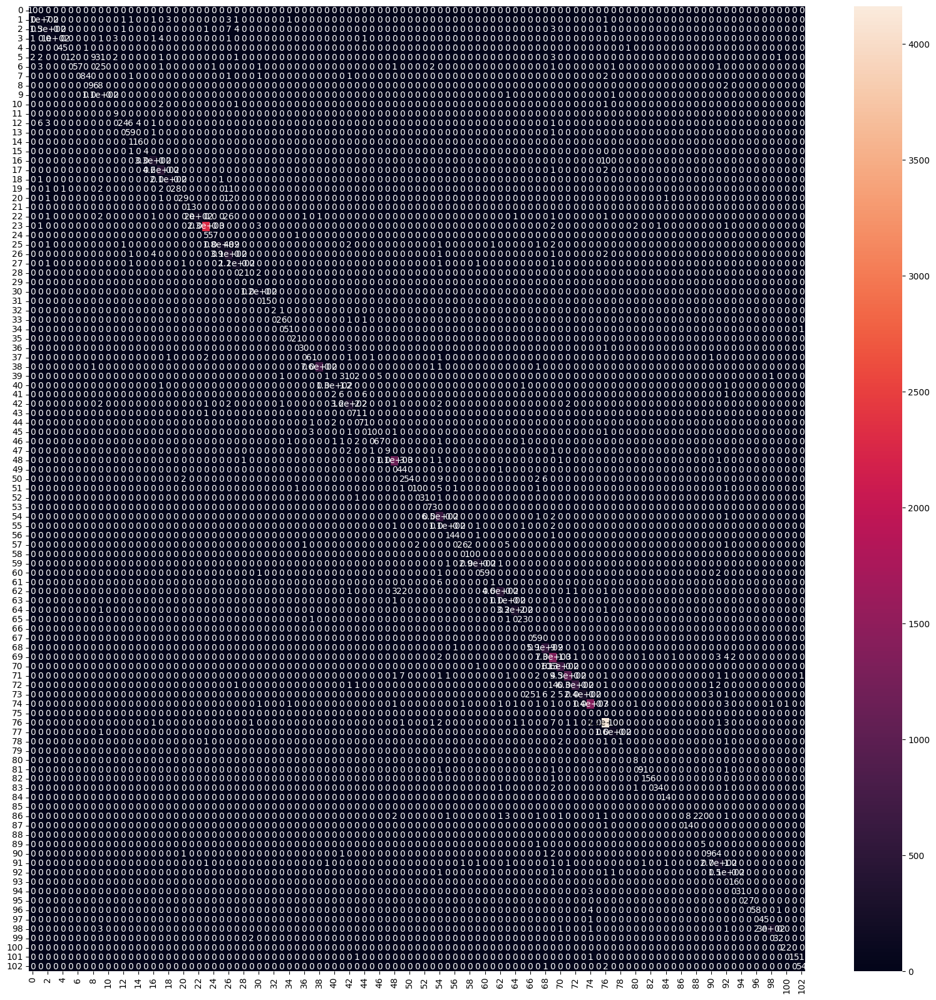

In [69]:
from sklearn.metrics import confusion_matrix

cf = confusion_matrix(y_true, y_pred)
df_cm = pd.DataFrame(cf)
plt.figure(figsize = (20,20))
sns.heatmap(df_cm, annot=True)

In [70]:
torch.save(model.state_dict(), 'cnn_rtsd_r3.pt')

# R1 + R3

In [121]:
class RTSD(Dataset):


    def __init__(self,
                 root1: str,
                 root2: str,
                 split: str,
                 transform: Optional[Callable] = None):

        self.base_folder = pathlib.Path(root1) 
        self.csv_file = self.base_folder / ('gt_train.csv' if split =='train' else 'gt_test.csv')
        self.base_folder = self.base_folder / ('train' if split =='train' else 'test')

        # Change this according to your system
        with open(str(self.csv_file)) as csvfile:
           samples1 = [(str(self.base_folder / row['filename']),int(row['class_number']))
            for row in csv.DictReader(csvfile,delimiter=',',skipinitialspace=True)
                ]

        self.base_folder = pathlib.Path(root2) 
        self.csv_file = self.base_folder / ('gt_train.csv' if split =='train' else 'gt_test.csv')
        self.base_folder = self.base_folder / ('train' if split =='train' else 'test')

        # Change this according to your system
        with open(str(self.csv_file)) as csvfile:
           samples2 = [(str(self.base_folder / row['filename']),int(row['class_number']))
            for row in csv.DictReader(csvfile,delimiter=',',skipinitialspace=True)
                ]


        self.samples = samples1 + samples2
        self.split = split
        self.transform = transform


    def __len__(self):

        return len(self.samples)


    def __getitem__(self, index: int) -> Tuple:

        path,classId =  self.samples[index]
        sample = PIL.Image.open(path).convert('RGB')
        if self.transform is not None:
            sample = self.transform(sample)

        return sample,classId

In [122]:
dataset = RTSD(root1='rtsd-public/classification/rtsd-r1/', root2='rtsd-public/classification/rtsd-r3/',split="train")

train_set,validation_set = train_test_split(dataset,train_size=0.8)
print(f'training size : {len(train_set)}, Validation size : {len(validation_set)}')

training size : 76895, Validation size : 19224


In [124]:
import tqdm
EPOCHS = 20
LEARNING_RATE = 0.0008
INPUT_DIM = 3*50*50
OUTPUT_DIM = 43
model = GTSRB_MODEL(INPUT_DIM,OUTPUT_DIM)

optimizer = Adam(params=model.parameters(),lr=LEARNING_RATE)
lr_s = lr_scheduler.LinearLR(optimizer,start_factor=1.0,end_factor=0.5,total_iters=10)
loss = nn.CrossEntropyLoss()

In [125]:
model.load_state_dict(torch.load('../../services/sign_classifier/models/cnn_torch.pt'))

<All keys matched successfully>

In [126]:
NEW_OUTPUT_DIM =106

model.l3 = nn.Linear(128, NEW_OUTPUT_DIM)

model.to(device)

GTSRB_MODEL(
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (dropout2): Dropout(p=0.2, inplace=False)
  (dropout3): Dropout(p=0.3, inplace=False)
  (relu): ReLU()
  (maxpool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (batchnorm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (batchnorm2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv5): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1))
  (conv6): Conv2d(512, 1024, kernel_size=(3, 3), stride=(1, 1))
  (batchnorm3): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (l1): Linear(in_fe

In [127]:
train_set.dataset.transform = train_transforms
validation_set.dataset.transform = validation_transforms

In [128]:
BATCH_SIZE = 64
train_loader = DataLoader(dataset=train_set,batch_size=BATCH_SIZE,shuffle=True)
validation_loader = DataLoader(dataset=validation_set,batch_size=BATCH_SIZE)

In [129]:
model.compile(train_data=train_loader,validation_data=validation_loader,epochs=EPOCHS,loss_function=loss,optimizer=optimizer,learning_rate_scheduler=lr_s)

Beginning training...


  0%|          | 0/1202 [00:00<?, ?it/s]

Epoch [0/20], Step [1201/1202],Learning Rate [0.0008], Loss [0.2606],Accuracy [0.8205]: 100%|██████████| 1202/1202 [00:37<00:00, 31.77it/s]


val_accuracy [0.9087078651685393], val_loss [0.15095698833465576]


Epoch [1/20], Step [1201/1202],Learning Rate [0.00076], Loss [0.1347],Accuracy [0.9369]: 100%|██████████| 1202/1202 [00:37<00:00, 32.38it/s]


val_accuracy [0.9577611319184353], val_loss [0.05714328959584236]


Epoch [2/20], Step [1201/1202],Learning Rate [0.00072], Loss [0.1986],Accuracy [0.9660]: 100%|██████████| 1202/1202 [00:36<00:00, 33.03it/s]


val_accuracy [0.9623907615480649], val_loss [0.04840477928519249]


Epoch [3/20], Step [1201/1202],Learning Rate [0.00068], Loss [0.0725],Accuracy [0.9778]: 100%|██████████| 1202/1202 [00:36<00:00, 32.80it/s]


val_accuracy [0.9743549729504786], val_loss [0.008328762836754322]


Epoch [4/20], Step [1201/1202],Learning Rate [0.00064], Loss [0.0860],Accuracy [0.9829]: 100%|██████████| 1202/1202 [00:37<00:00, 32.11it/s]


val_accuracy [0.9720141489804411], val_loss [0.015300323255360126]


Epoch [5/20], Step [1201/1202],Learning Rate [0.0006000000000000001], Loss [0.0589],Accuracy [0.9868]: 100%|██████████| 1202/1202 [00:36<00:00, 32.75it/s]


val_accuracy [0.9692051602163961], val_loss [0.1184435710310936]


Epoch [6/20], Step [1201/1202],Learning Rate [0.0005600000000000001], Loss [0.0062],Accuracy [0.9894]: 100%|██████████| 1202/1202 [00:36<00:00, 33.21it/s]


val_accuracy [0.9764357053682896], val_loss [0.00883379578590393]


Epoch [7/20], Step [1201/1202],Learning Rate [0.0005200000000000001], Loss [0.0277],Accuracy [0.9907]: 100%|██████████| 1202/1202 [00:36<00:00, 33.00it/s]


val_accuracy [0.9775280898876404], val_loss [0.006688399706035852]


Epoch [8/20], Step [1201/1202],Learning Rate [0.00048000000000000007], Loss [0.0172],Accuracy [0.9928]: 100%|██████████| 1202/1202 [00:36<00:00, 33.04it/s]


val_accuracy [0.9811173533083646], val_loss [0.013891354203224182]


Epoch [9/20], Step [1201/1202],Learning Rate [0.00044000000000000007], Loss [0.0020],Accuracy [0.9937]: 100%|██████████| 1202/1202 [00:36<00:00, 32.88it/s]


val_accuracy [0.9781002913025385], val_loss [0.001825619488954544]


Epoch [10/20], Step [1201/1202],Learning Rate [0.0004000000000000001], Loss [0.0085],Accuracy [0.9944]: 100%|██████████| 1202/1202 [00:36<00:00, 32.89it/s]


val_accuracy [0.9773200166458593], val_loss [0.0037558504845947027]


Epoch [11/20], Step [1201/1202],Learning Rate [0.0004000000000000001], Loss [0.1025],Accuracy [0.9951]: 100%|██████████| 1202/1202 [00:36<00:00, 33.06it/s]


val_accuracy [0.9805451518934665], val_loss [0.014480196870863438]


Epoch [12/20], Step [1201/1202],Learning Rate [0.0004000000000000001], Loss [0.0383],Accuracy [0.9951]: 100%|██████████| 1202/1202 [00:36<00:00, 33.16it/s]


val_accuracy [0.9820536828963795], val_loss [0.0028019410092383623]


Epoch [13/20], Step [1201/1202],Learning Rate [0.0004000000000000001], Loss [0.0206],Accuracy [0.9945]: 100%|██████████| 1202/1202 [00:36<00:00, 33.11it/s]


val_accuracy [0.9781002913025385], val_loss [0.009978209622204304]


Epoch [14/20], Step [1201/1202],Learning Rate [0.0004000000000000001], Loss [0.0006],Accuracy [0.9958]: 100%|██████████| 1202/1202 [00:36<00:00, 33.16it/s]


val_accuracy [0.9775280898876404], val_loss [0.0008072471246123314]


Epoch [15/20], Step [1201/1202],Learning Rate [0.0004000000000000001], Loss [0.0105],Accuracy [0.9957]: 100%|██████████| 1202/1202 [00:36<00:00, 33.08it/s]


val_accuracy [0.9785164377861008], val_loss [0.04168921336531639]


Epoch [16/20], Step [1201/1202],Learning Rate [0.0004000000000000001], Loss [0.0049],Accuracy [0.9961]: 100%|██████████| 1202/1202 [00:36<00:00, 33.11it/s]


val_accuracy [0.9804411152725759], val_loss [0.0040361606515944]


Epoch [17/20], Step [1201/1202],Learning Rate [0.0004000000000000001], Loss [0.1013],Accuracy [0.9966]: 100%|██████████| 1202/1202 [00:36<00:00, 33.15it/s]


val_accuracy [0.9769038701622972], val_loss [0.015213258564472198]


Epoch [18/20], Step [1201/1202],Learning Rate [0.0004000000000000001], Loss [0.0021],Accuracy [0.9963]: 100%|██████████| 1202/1202 [00:36<00:00, 33.02it/s]


val_accuracy [0.9803890969621307], val_loss [0.010950103402137756]


Epoch [19/20], Step [1201/1202],Learning Rate [0.0004000000000000001], Loss [0.0004],Accuracy [0.9961]: 100%|██████████| 1202/1202 [00:36<00:00, 33.06it/s]


val_accuracy [0.9822097378277154], val_loss [0.0038328419905155897]
Training complete!


In [131]:
transforms = Compose(
    [
        Resize([50,50]),
        ToTensor(),
    ]
)

testdata = RTSD(root1='rtsd-public/classification/rtsd-r1/', root2='rtsd-public/classification/rtsd-r3/',split='test',transform=transforms)
test_dataloader = DataLoader(testdata)
print('testing size :',len(testdata))

testing size : 30518


In [132]:
y_pred = []
y_true = []
model = model.eval().to(device)
with tqdm.tqdm(colour='green',total=len(test_dataloader)) as progress:

  with torch.no_grad() :
    for id,(input,label) in enumerate(iter(test_dataloader)):
        input,label = input.to(device),label.to(device)
        y_true.append(label.item())
        prediction = model.forward(input)
        _,prediction = torch.max(prediction,1)
        y_pred.append(prediction.item())

        progress.desc = f'Test Accuracy : {accuracy_score(y_true,y_pred)} '
        progress.update(1)

Test Accuracy : 0.9465561308080477 : 100%|██████████| 30518/30518 [01:35<00:00, 320.98it/s]


<Axes: >

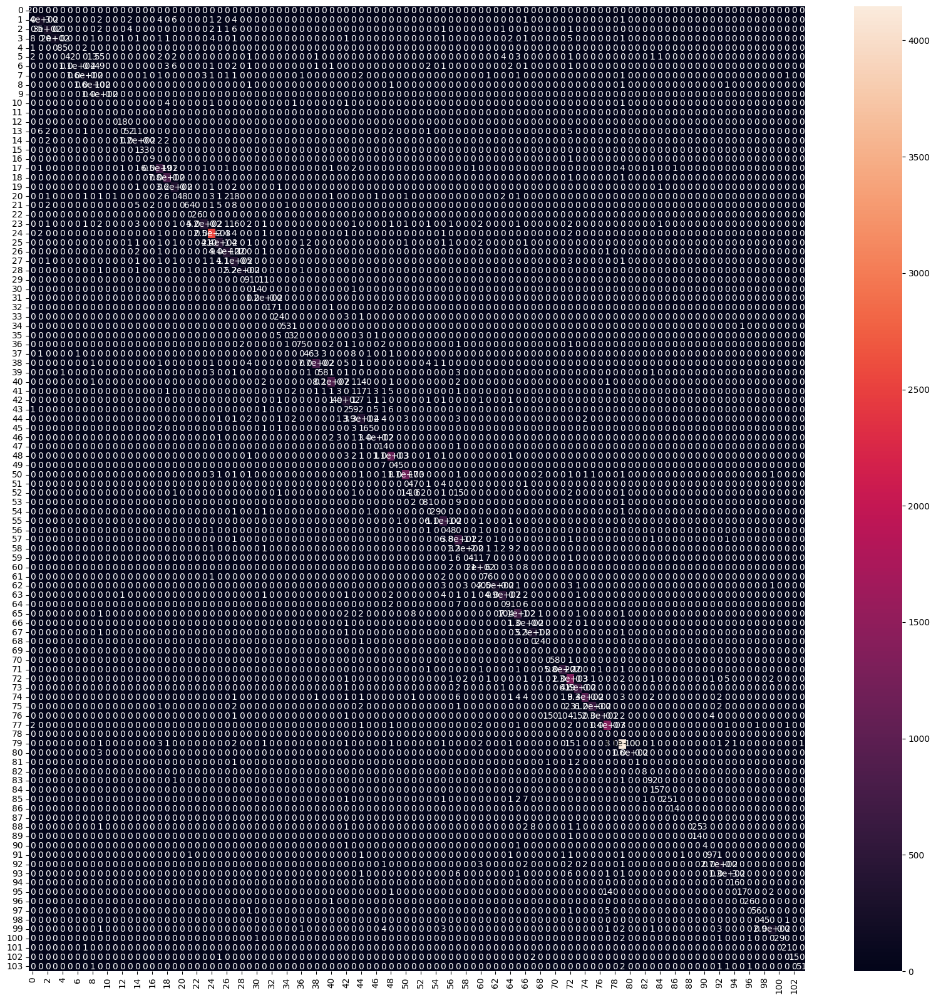

In [133]:
from sklearn.metrics import confusion_matrix

cf = confusion_matrix(y_true, y_pred)
df_cm = pd.DataFrame(cf)
plt.figure(figsize = (20,20))
sns.heatmap(df_cm, annot=True)

In [135]:
from sklearn.metrics import classification_report

print(classification_report(y_true, y_pred))

              precision    recall  f1-score   support

           0       0.59      1.00      0.74        20
           1       0.94      0.90      0.92       262
           2       0.96      0.93      0.94       321
           3       1.00      0.87      0.93       224
           4       0.99      0.97      0.98        88
           5       1.00      0.33      0.49       128
           6       0.99      0.60      0.75       188
           7       0.96      0.91      0.94       174
           8       0.88      0.92      0.90       172
           9       0.51      1.00      0.67       135
          10       0.00      0.00      0.00         8
          11       0.00      0.00      0.00         0
          12       0.86      1.00      0.92        18
          13       0.88      0.65      0.75        80
          14       0.81      0.95      0.87       122
          15       0.97      0.97      0.97        34
          16       0.82      0.90      0.86        10
          17       0.97    

/home/vagabond/Documents/signs-classification/venv/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/vagabond/Documents/signs-classification/venv/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/vagabond/Documents/signs-classification/venv/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn

In [134]:
torch.save(model.state_dict(), 'cnn_rtsd_r1_r3.pt')

### Обучаем итоговую модель

In [124]:
class RTSD(Dataset):


    def __init__(self,
                 root1: str,
                 root2: str,
                 transform: Optional[Callable] = None):

        self.base_folder = pathlib.Path(root1) 
        self.csv_file = self.base_folder / ('gt_train.csv')
        self.base_folder_train = self.base_folder / ('train')

        with open(str(self.csv_file)) as csvfile:
           samples1_train = [(str(self.base_folder_train / row['filename']),int(row['class_number']))
            for row in csv.DictReader(csvfile,delimiter=',',skipinitialspace=True)
                ]
        
        self.csv_file = self.base_folder / ('gt_test.csv')
        self.base_folder_test = self.base_folder / ('test')
           
        with open(str(self.csv_file)) as csvfile:
           samples1_test = [(str(self.base_folder_test / row['filename']),int(row['class_number']))
            for row in csv.DictReader(csvfile,delimiter=',',skipinitialspace=True)
                ]

        self.base_folder = pathlib.Path(root2) 
        self.csv_file = self.base_folder / ('gt_train.csv')
        self.base_folder_train = self.base_folder / ('train')

        with open(str(self.csv_file)) as csvfile:
           samples2_train = [(str(self.base_folder_train / row['filename']),int(row['class_number']))
            for row in csv.DictReader(csvfile,delimiter=',',skipinitialspace=True)
                ]
        
        self.csv_file = self.base_folder / ('gt_test.csv')
        self.base_folder_test = self.base_folder / ('test')
           
        with open(str(self.csv_file)) as csvfile:
           samples2_test = [(str(self.base_folder_test / row['filename']),int(row['class_number']))
            for row in csv.DictReader(csvfile,delimiter=',',skipinitialspace=True)
                ]

        self.samples = samples1_train + samples1_test + samples2_train + samples2_test
        self.transform = transform


    def __len__(self):

        return len(self.samples)


    def __getitem__(self, index: int) -> Tuple:

        path,classId =  self.samples[index]
        sample = PIL.Image.open(path).convert('RGB')
        if self.transform is not None:
            sample = self.transform(sample)

        return sample,classId

In [142]:
dataset = RTSD(root1='rtsd-public/classification/rtsd-r1/', root2='rtsd-public/classification/rtsd-r3/')
train_set,validation_set = train_test_split(dataset,train_size=0.9)
print(f'training size : {len(train_set)}, Validation size : {len(validation_set)}')

training size : 113973, Validation size : 12664


In [143]:
import tqdm
EPOCHS = 20
LEARNING_RATE = 0.0008
INPUT_DIM = 3*50*50
OUTPUT_DIM = 43
model = GTSRB_MODEL(INPUT_DIM,OUTPUT_DIM)

optimizer = Adam(params=model.parameters(),lr=LEARNING_RATE)
lr_s = lr_scheduler.LinearLR(optimizer,start_factor=1.0,end_factor=0.5,total_iters=10)
loss = nn.CrossEntropyLoss()

In [144]:
model.load_state_dict(torch.load('../../services/sign_classifier/models/cnn_torch.pt'))

<All keys matched successfully>

In [145]:
NEW_OUTPUT_DIM =106

model.l3 = nn.Linear(128, NEW_OUTPUT_DIM)

model.to(device)

GTSRB_MODEL(
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (dropout2): Dropout(p=0.2, inplace=False)
  (dropout3): Dropout(p=0.3, inplace=False)
  (relu): ReLU()
  (maxpool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (batchnorm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (batchnorm2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv5): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1))
  (conv6): Conv2d(512, 1024, kernel_size=(3, 3), stride=(1, 1))
  (batchnorm3): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (l1): Linear(in_fe

In [146]:
train_set.dataset.transform = train_transforms
validation_set.dataset.transform = validation_transforms

In [147]:
BATCH_SIZE = 64
train_loader = DataLoader(dataset=train_set,batch_size=BATCH_SIZE,shuffle=True)
validation_loader = DataLoader(dataset=validation_set,batch_size=BATCH_SIZE)

In [148]:
model.compile(train_data=train_loader,validation_data=validation_loader,epochs=EPOCHS,loss_function=loss,optimizer=optimizer,learning_rate_scheduler=lr_s)

Beginning training...


Epoch [0/20], Step [1780/1781],Learning Rate [0.0008], Loss [0.3852],Accuracy [0.8464]: 100%|██████████| 1781/1781 [01:13<00:00, 24.30it/s]


val_accuracy [0.9252210991787745], val_loss [0.15715856850147247]


Epoch [1/20], Step [1780/1781],Learning Rate [0.00076], Loss [0.1896],Accuracy [0.9509]: 100%|██████████| 1781/1781 [00:52<00:00, 33.72it/s]


val_accuracy [0.9605180037902716], val_loss [0.045380257070064545]


Epoch [2/20], Step [1780/1781],Learning Rate [0.00072], Loss [0.0958],Accuracy [0.9717]: 100%|██████████| 1781/1781 [00:52<00:00, 33.62it/s]


val_accuracy [0.9709412507896399], val_loss [0.05335500091314316]


Epoch [3/20], Step [1780/1781],Learning Rate [0.00068], Loss [0.0608],Accuracy [0.9814]: 100%|██████████| 1781/1781 [00:52<00:00, 33.68it/s]


val_accuracy [0.9750473783954516], val_loss [0.032283131033182144]


Epoch [4/20], Step [1780/1781],Learning Rate [0.00064], Loss [0.0589],Accuracy [0.9859]: 100%|██████████| 1781/1781 [00:52<00:00, 33.71it/s]


val_accuracy [0.9605180037902716], val_loss [0.03961525112390518]


Epoch [5/20], Step [1780/1781],Learning Rate [0.0006000000000000001], Loss [0.0962],Accuracy [0.9893]: 100%|██████████| 1781/1781 [00:53<00:00, 33.59it/s]


val_accuracy [0.9793114339861023], val_loss [0.018693311139941216]


Epoch [6/20], Step [1780/1781],Learning Rate [0.0005600000000000001], Loss [0.0544],Accuracy [0.9909]: 100%|██████████| 1781/1781 [00:52<00:00, 33.61it/s]


val_accuracy [0.9791535060012634], val_loss [0.010405980981886387]


Epoch [7/20], Step [1780/1781],Learning Rate [0.0005200000000000001], Loss [0.0073],Accuracy [0.9930]: 100%|██████████| 1781/1781 [00:52<00:00, 33.63it/s]


val_accuracy [0.9787586860391662], val_loss [0.03208506479859352]


Epoch [8/20], Step [1780/1781],Learning Rate [0.00048000000000000007], Loss [0.0287],Accuracy [0.9937]: 100%|██████████| 1781/1781 [00:52<00:00, 33.76it/s]


val_accuracy [0.973547062539482], val_loss [0.006167442537844181]


Epoch [9/20], Step [1780/1781],Learning Rate [0.00044000000000000007], Loss [0.0063],Accuracy [0.9955]: 100%|██████████| 1781/1781 [00:52<00:00, 33.76it/s]


val_accuracy [0.9834175615919141], val_loss [0.013789822347462177]


Epoch [10/20], Step [1780/1781],Learning Rate [0.0004000000000000001], Loss [0.0141],Accuracy [0.9957]: 100%|██████████| 1781/1781 [00:52<00:00, 33.82it/s]


val_accuracy [0.9804169298799748], val_loss [0.0031712730415165424]


Epoch [11/20], Step [1780/1781],Learning Rate [0.0004000000000000001], Loss [0.0037],Accuracy [0.9957]: 100%|██████████| 1781/1781 [00:52<00:00, 33.85it/s]


val_accuracy [0.9812065698041693], val_loss [0.010050407610833645]


Epoch [12/20], Step [1780/1781],Learning Rate [0.0004000000000000001], Loss [0.0474],Accuracy [0.9961]: 100%|██████████| 1781/1781 [00:52<00:00, 33.79it/s]


val_accuracy [0.9797852179406191], val_loss [0.00448758527636528]


Epoch [13/20], Step [1780/1781],Learning Rate [0.0004000000000000001], Loss [0.0015],Accuracy [0.9966]: 100%|██████████| 1781/1781 [00:52<00:00, 33.79it/s]


val_accuracy [0.9849968414403032], val_loss [0.020406389608979225]


Epoch [14/20], Step [1780/1781],Learning Rate [0.0004000000000000001], Loss [0.0034],Accuracy [0.9960]: 100%|██████████| 1781/1781 [00:52<00:00, 33.83it/s]


val_accuracy [0.9780480101073911], val_loss [0.0645558089017868]


Epoch [15/20], Step [1780/1781],Learning Rate [0.0004000000000000001], Loss [0.0007],Accuracy [0.9967]: 100%|██████████| 1781/1781 [00:52<00:00, 33.82it/s]


val_accuracy [0.9812065698041693], val_loss [0.002315938239917159]


Epoch [16/20], Step [1780/1781],Learning Rate [0.0004000000000000001], Loss [0.0040],Accuracy [0.9970]: 100%|██████████| 1781/1781 [00:51<00:00, 34.62it/s]


val_accuracy [0.9846809854706254], val_loss [0.0033707565162330866]


Epoch [17/20], Step [1780/1781],Learning Rate [0.0004000000000000001], Loss [0.0016],Accuracy [0.9972]: 100%|██████████| 1781/1781 [00:48<00:00, 36.99it/s]


val_accuracy [0.9834965255843335], val_loss [0.01645069010555744]


Epoch [18/20], Step [1780/1781],Learning Rate [0.0004000000000000001], Loss [0.0004],Accuracy [0.9969]: 100%|██████████| 1781/1781 [00:48<00:00, 37.00it/s]


val_accuracy [0.9816013897662665], val_loss [0.008039611391723156]


Epoch [19/20], Step [1780/1781],Learning Rate [0.0004000000000000001], Loss [0.0047],Accuracy [0.9972]: 100%|██████████| 1781/1781 [00:48<00:00, 37.00it/s]


val_accuracy [0.9842861655085281], val_loss [0.02301659993827343]
Training complete!


In [150]:
torch.save(model.state_dict(), 'cnn_rtsd_final.pt')